In [1]:
from scipy.io import arff
import pandas as pd
from sklearn import metrics
import numpy as np
from pandas_profiling import ProfileReport
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
import pydot
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import statsmodels.api as sm
from sklearn.utils import resample
import seaborn as sns
from sklearn.impute import KNNImputer
#df=pd.read_excel(r'C:\Users\49173\Desktop\New folder\year1\upsampled.xlsx')
data = arff.loadarff8(r'C:\Users\49173\Desktop\Data Science Assessment  \
                    - BANKRUPTCY CLASSIFICATION (1)\data\data\1year.arff')
df = pd.DataFrame(data[0])
#df.head()

Exploraing the data

In [ ]:
prof = ProfileReport(df)
prof.to_file('year1.html')

In [2]:
df=df[["Attr1","Attr2","Attr3","Attr4","Attr5","Attr6","Attr7","Attr8",
       "Attr9","Attr12","Attr13","Attr15","Attr19","Attr21","Attr25",
       "Attr27","Attr28","Attr29","Attr32","Attr33","Attr35","Attr37",
       "Attr41","Attr45","Attr47","Attr49","Attr50","Attr53","Attr55",
       "Attr57","Attr59","Attr60","class"]]

Replacing the missing values

In [3]:
#worse assumption
#imputer = KNNImputer(n_neighbors=2)
#df_filled = imputer.fit_transform(df)
#df = pd.DataFrame(data=df_filled)
#df.head()
#better assumption
df.fillna(df.mean(), inplace=True)

Removing the outliers

In [4]:
ds=df.drop(['class'], axis=1)
Q1 = ds.quantile(0.25)
Q3 = ds.quantile(0.75)
IQR = Q3 - Q1
print(IQR)
w=(ds < (Q1 - 1.5 * IQR)) |(ds > (Q3 + 1.5 * IQR))
print(w)
df = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
df.shape

Attr1        0.139032
Attr2        0.383410
Attr3        0.335489
Attr4        1.411950
Attr5       82.323500
Attr6        0.146570
Attr7        0.160843
Attr8        1.839360
Attr9        1.095900
Attr12       0.634788
Attr13       0.106882
Attr15    1822.385000
Attr19       0.089688
Attr21       0.981050
Attr25       0.408765
Attr27       8.437250
Attr28       1.259663
Attr29       0.882200
Attr32      71.594500
Attr33       4.437000
Attr35       0.166576
Attr37     171.007194
Attr41       0.177592
Attr45       1.051179
Attr47      51.110500
Attr49       0.085456
Attr50       1.171430
Attr53       1.339895
Attr55    5858.780000
Attr57       0.295081
Attr59       0.274140
Attr60      15.353450
dtype: float64
      Attr1  Attr2  Attr3  Attr4  Attr5  Attr6  Attr7  Attr8  Attr9  Attr12  \
0     False  False  False  False  False   True  False  False  False   False   
1     False  False  False  False  False  False  False  False  False   False   
2     False  False  False  False  False  Fal

(1326, 33)

Sovling skewed values

In [5]:
dis=np.sqrt(df)
dis.skew()

C:\Users\49173\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in sqrt
  


Unnamed: 0    -0.671086
Attr1         -0.023547
Attr2         -0.265623
Attr3         -0.192004
Attr4          0.745860
Attr5          0.318614
Attr6         -0.207113
Attr7          0.023309
Attr8          0.525735
Attr9          1.642191
Attr12         0.403391
Attr13         0.343811
Attr15         0.642680
Attr19        -0.000553
Attr21         0.028252
Attr25        -0.949128
Attr27         1.047653
Attr28         0.430223
Attr29        -0.032576
Attr32         0.328428
Attr33         0.512652
Attr35         0.092530
Attr37         1.107457
Attr41         0.550238
Attr45         0.467962
Attr47         0.172279
Attr49         0.080661
Attr50         0.411995
Attr53         0.450774
Attr55         0.322678
Attr57        -0.005088
Attr59         0.486196
Attr60         0.813897
class         10.093319
dtype: float64

upsampling the data

In [6]:
y = df["class"]
X = df.drop('class', axis=1)
# setting up testing and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=27)

In [7]:
X = pd.concat([X_train, y_train], axis=1)
X.head()

,Unnamed: 0,Attr1,Attr2,Attr3,Attr4,Attr5,Attr6,Attr7,Attr8,Attr9,...,Attr45,Attr47,Attr49,Attr50,Attr53,Attr55,Attr57,Attr59,Attr60,class
351,3104,0.009997,0.39576,0.328580,2.2643,33.2560,0.000816,0.009997,1.5268,2.3072,...,0.092433,21.361,-0.018972,1.48690,1.46830,979.06,0.016545,0.144080,21.3320,0
416,3646,0.001911,0.33397,0.443060,2.6553,2.9511,0.000010,0.003203,1.9943,1.3816,...,0.004529,110.940,-0.004030,2.12810,2.30230,2502.90,0.002869,0.096150,3.2746,0
759,6286,0.159300,0.40041,0.261130,1.6958,18.6920,0.280150,0.195160,1.3443,1.1217,...,0.943120,34.666,0.089264,1.58940,1.48060,4123.40,0.295950,0.046647,11.8100,0
136,1375,0.013790,0.24366,0.164020,1.8752,-6.0843,0.000000,0.025390,3.1041,1.0532,...,0.105830,45.733,-0.003002,1.44230,1.16620,4837.90,0.018232,0.010727,8.0828,0
131,1306,0.099090,0.70766,0.059643,1.1082,-69.5910,0.008781,0.129280,0.4131,1.8655,...,0.265430,80.083,0.048694,0.86334,0.75142,682.92,0.338960,0.493640,4.9971,0


In [8]:
not_fraud = X[X["class"]==0]
fraud = X[X["class"]==1]

# upsample minority
fraud_upsampled = resample(fraud,
                          replace=True, # sample with replacement
                          n_samples=len(not_fraud), # match number in majority class
                          random_state=27) # reproducible results

# combine majority and upsampled minority
upsampled = pd.concat([not_fraud, fraud_upsampled])

# check new class counts
upsampled["class"].value_counts()

1    622
0    622
Name: class, dtype: int64

Handling missing values

In [9]:
upsampled.fillna(upsampled.mean(), inplace=True)


Investigitaing the important features to be considered in the model

In [10]:
x=df[["Attr1","Attr2","Attr3","Attr4","Attr5","Attr6","Attr8",
      "Attr9","Attr12","Attr13","Attr15","Attr19","Attr21",
      "Attr25","Attr27","Attr28","Attr29","Attr32","Attr33","Attr35",
      "Attr37","Attr45","Attr47","Attr49","Attr50","Attr53","Attr55",
      "Attr57","Attr59","Attr60"]]
y = df["class"]

In [11]:
logit_model=sm.Logit(y,x)
result=logit_model.fit()

print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.231908
         Iterations 10
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.665    
Dependent Variable: class            AIC:              973.7185 
Date:               2020-04-03 19:44 BIC:              1141.2922
No. Observations:   1970             Log-Likelihood:   -456.86  
Df Model:           29               LL-Null:          -1365.5  
Df Residuals:       1940             LLR p-value:      0.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     10.0000                                     
-----------------------------------------------------------------
           Coef.    Std.Err.     z     P>|z|    [0.025    0.975] 
-----------------------------------------------------------------
Attr1      15.8095    9.3154   1.6971  0.0897   -2.4483   34.0672
Attr2      37.4127    8.2410   4.5398  0.0000   21.2606   53.5647
Attr3  

In [12]:
X = df.drop(['class','Attr21','Attr29','Attr33','Attr37','Attr45','Attr59'], axis=1)
y = df["class"]
logit_model=sm.Logit(y,x)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.231908
         Iterations 10
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.665    
Dependent Variable: class            AIC:              973.7185 
Date:               2020-04-03 19:44 BIC:              1141.2922
No. Observations:   1970             Log-Likelihood:   -456.86  
Df Model:           29               LL-Null:          -1365.5  
Df Residuals:       1940             LLR p-value:      0.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     10.0000                                     
-----------------------------------------------------------------
           Coef.    Std.Err.     z     P>|z|    [0.025    0.975] 
-----------------------------------------------------------------
Attr1      15.8095    9.3154   1.6971  0.0897   -2.4483   34.0672
Attr2      37.4127    8.2410   4.5398  0.0000   21.2606   53.5647
Attr3  

In [13]:
x= x.drop(['Attr12','Attr21','Attr29','Attr33','Attr45','Attr37',"Attr59"], axis=1)
y = df["class"]
logit_model=sm.Logit(y,x)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.234841
         Iterations 10
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.661    
Dependent Variable: class            AIC:              971.2741 
Date:               2020-04-03 19:45 BIC:              1099.7472
No. Observations:   1970             Log-Likelihood:   -462.64  
Df Model:           22               LL-Null:          -1365.5  
Df Residuals:       1947             LLR p-value:      0.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     10.0000                                     
-----------------------------------------------------------------
           Coef.    Std.Err.     z     P>|z|    [0.025    0.975] 
-----------------------------------------------------------------
Attr1      21.0631    6.1145   3.4448  0.0006    9.0789   33.0473
Attr2      40.1866    5.7167   7.0297  0.0000   28.9821   51.3910
Attr3  

Train the model

In [14]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3,
                                                    random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

C:\Users\49173\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [15]:
scores = []
logreg = LogisticRegression(max_iter=1000000)
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
for i, (train, test) in enumerate(kfold.split(x, y)):
    logreg.fit(X_train, y_train)
    score = logreg.score(x.iloc[test], y.iloc[test])
    scores.append(score)
    
print(scores)

[0.9390862944162437, 0.9111675126903553, 0.8857868020304569, 0.9137055837563451, 0.9137055837563451]


Validate the results

In [16]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'
                                .format(logreg.score(X_test, y_test)))
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

Accuracy of logistic regression classifier on test set: 0.90
[[238  60]
 [  0 293]]


In [17]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.80      0.89       298
           1       0.83      1.00      0.91       293

    accuracy                           0.90       591
   macro avg       0.92      0.90      0.90       591
weighted avg       0.92      0.90      0.90       591



Define the importance of features

In [18]:
from sklearn.feature_selection import RFE
pred=X_train
sel=RFE(logreg,n_features_to_select=1)
sel=sel.fit(pred,y_train)

In [19]:
order=sel.ranking_
order

array([ 9, 21, 13, 12, 17,  1, 11,  3,  2, 23, 10,  5, 20,  7, 18, 16, 15,
        6, 19,  8, 22,  4, 14])

In [20]:
df=x
feature=[]
for i in order:
    feature.append(f"{i}.{df.columns[i-1]}")
feature 

['9.Attr13',
 '21.Attr55',
 '13.Attr27',
 '12.Attr25',
 '17.Attr47',
 '1.Attr1',
 '11.Attr19',
 '3.Attr3',
 '2.Attr2',
 '23.Attr60',
 '10.Attr15',
 '5.Attr5',
 '20.Attr53',
 '7.Attr8',
 '18.Attr49',
 '16.Attr35',
 '15.Attr32',
 '6.Attr6',
 '19.Attr50',
 '8.Attr9',
 '22.Attr57',
 '4.Attr4',
 '14.Attr28']

In [21]:
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold

rfecv = RFECV(estimator=logreg, step=1, cv=StratifiedKFold(10), 
              scoring='accuracy')
rfecv.fit(X_train, y_train)
print('Optimal number of features: {}'.format(rfecv.n_features_))


Optimal number of features: 23


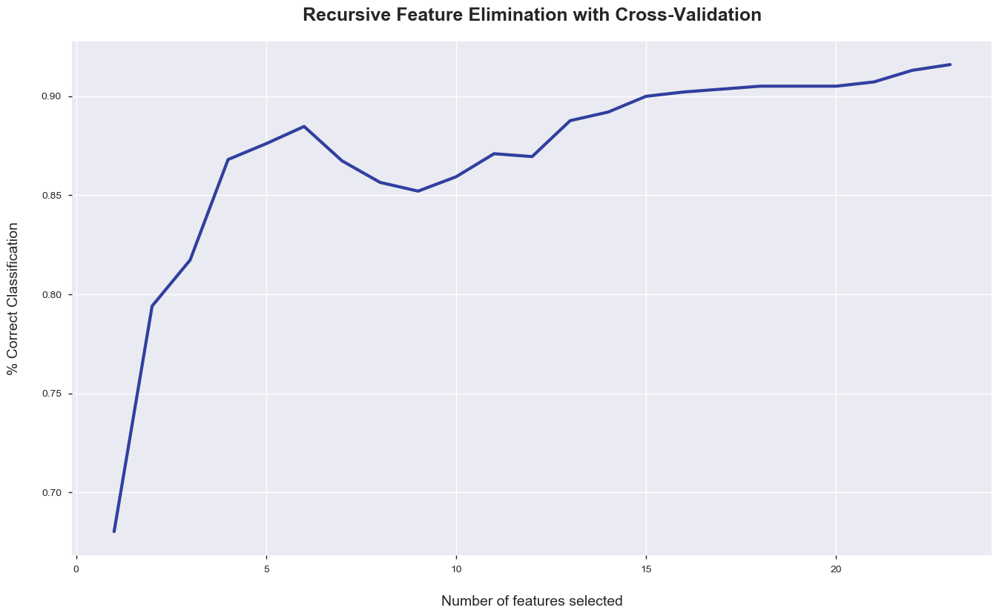

In [23]:
plt.figure(figsize=(16, 9))
plt.title('Recursive Feature Elimination with Cross-Validation',\
         fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Number of features selected', fontsize=14, labelpad=20)
plt.ylabel('% Correct Classification', fontsize=14, labelpad=20)
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_, \
         color='#303F9F', linewidth=3)

plt.show()

In [22]:
prof = ProfileReport(x)
prof.to_file('year1.html')

Visuliaze the results

C:\Users\49173\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\49173\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


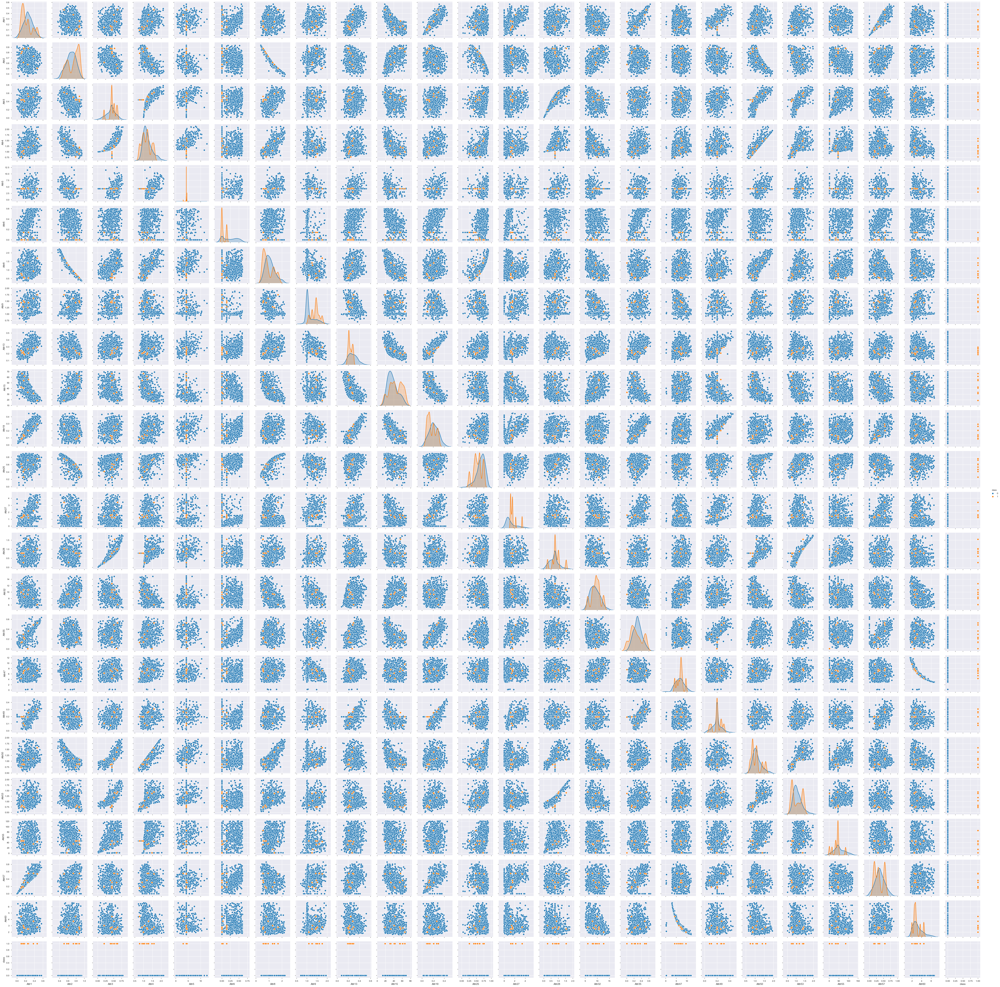

In [24]:
x["class"]=y
x.head()
sns.pairplot(x, hue = 'class')
#plt.savefig("year1.png", dpi=300)

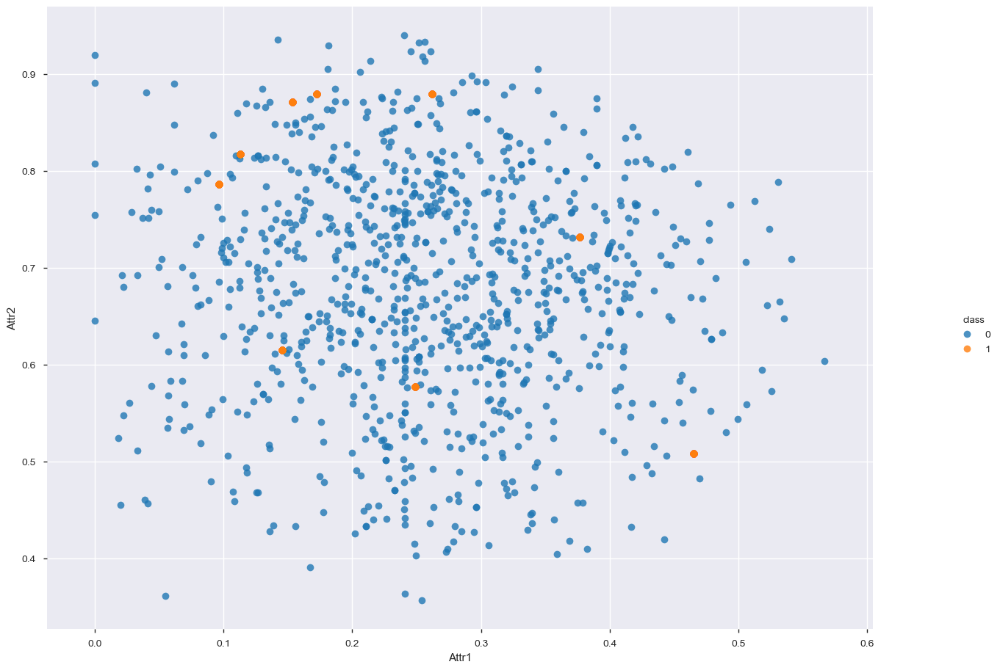

In [27]:
import seaborn as sns
sns.lmplot('Attr1', 'Attr2', x, hue='class', fit_reg=False)
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()

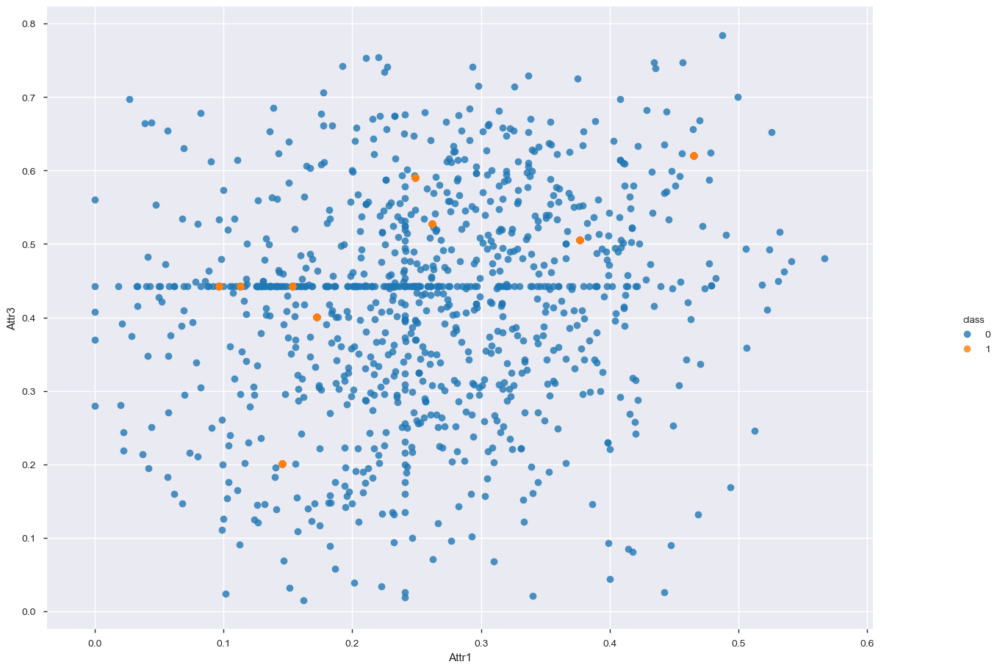

In [29]:
import seaborn as sns
sns.lmplot('Attr1', 'Attr3', x, hue='class', fit_reg=False)
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()